## Feature Similarity Between Asian Elephants - 

### Using:

### Triplet Loss

In [1]:
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader,Dataset
import matplotlib.pyplot as plt
import torchvision.utils
import numpy as np
import random
from PIL import Image
import torch
from torch.autograd import Variable
import PIL.ImageOps    
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import os
from torchvision import models
import csv
 
%matplotlib inline


### Helper Functions

In [2]:
## visualization helper
def imshow(img,text=None,should_save=False):
    npimg = img.numpy()
    image = np.transpose(npimg,(1,2,0))
    
    # Undo preprocessing
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
        
    image = np.clip(image, 0, 1)
    plt.imshow(image)
    plt.show() 
        
def visualize_loss(epochs, loss):
    plt.plot(range(epochs),loss)
    plt.show()
    
    
class RunningAverage(object):
    """Computes and stores the average and current value"""
    def __init__(self, name, fmt=':f'):
        self.name = name
        self.fmt = fmt
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

    def __str__(self):
        fmtstr = '{name} {val' + self.fmt + '} ({avg' + self.fmt + '})'
        return fmtstr.format(**self.__dict__)

## Configuration Of Triplets

In [3]:
class Config():
    train_dir = "/N/u/mchivuku/asian_elephant_facial_recognition/data/Resized Super Clean Images/"
    val_dir = "/N/u/mchivuku/asian_elephant_facial_recognition/data/Resized Super Clean Images/"
    test_dir = "/N/u/mchivuku/asian_elephant_facial_recognition/data/New Test Photos"
    
    ## Gallery images
    gallery_dir = "/N/u/mchivuku/asian_elephant_facial_recognition/data/gallery_images/"
    ## Query images
    query_dir = "/N/u/mchivuku/asian_elephant_facial_recognition/data/query_images/"
    
    batch_size = 8
    
    nepochs = 100
    learning_rate = 0.001
    num_classes = 14
    test_freq = 10
    
    
    n_train_triplets = 2000
    n_test_triplets = 100
    n_val_triplets = 900
    log_interval = 200
    
        
print(Config.train_dir)      

/N/u/mchivuku/asian_elephant_facial_recognition/data/Resized Super Clean Images/


### Dataloaders - Build triplets

In [4]:
class AsianElephantTripletDataset(Dataset):
    def __init__(self, n_train_triplets, n_test_triplets, train=True, transform = None, target_transform = None):
        
        self.transform = transform
        self.train = train
        
        
        if self.train:
            self.n_train_triplets = n_train_triplets
            ## Train and Validation
            train_folder = dset.ImageFolder(root=Config.train_dir)
            self.train_imgs, self.labels = list(map(lambda x: x[0],train_folder.imgs)),list(map(lambda x: x[1],train_folder.imgs))    
            
            self.train_triplet_file = "train_triplets_superclean.txt"
            
            ## Train Triplets
            self.make_triplet_list()
            triplets = []
            for line in open(self.train_triplet_file):
                triplets.append((int(line.split()[0]), int(line.split()[1]), int(line.split()[2]))) # anchor, close, far
            self.triplets_train = triplets
            
        else:
            self.n_test_triplets = n_test_triplets
            self.test_triplet_file = "test_triplets.txt"
            test_folder = dset.ImageFolder(root=Config.test_dir)
            self.test_imgs, self.test_labels = list(map(lambda x: x[0],test_folder.imgs)),list(map(lambda x: x[1],test_folder.imgs))    
            self.make_triplet_list()
           
            
            triplets = []
            for line in open(self.test_triplet_file):
                triplets.append((int(line.split()[0]), int(line.split()[1]), int(line.split()[2]))) # anchor, close, far
            self.triplets_test = triplets
        print(f"No of train triplets: {len(self.triplets_train)}")
            
    def make_triplet_list(self):
        if self.train:
            filename = self.train_triplet_file
            ntriplets = self.n_train_triplets
            labels  = (self.labels)
            
        else:
            filename = self.test_triplet_file
            ntriplets = self.n_test_triplets
            labels = (self.test_labels)
        triplets = []
        
        labels = np.array(labels)
        
        classes = np.unique(labels)
        
        for i in range(ntriplets):
            
            ## Pick one random class for anchor:
            anchor_class = np.random.randint(0,Config.num_classes) if self.train else np.random.choice(classes,size=1)
            
            [idx_A,idx_P] = np.random.choice(np.where(labels==anchor_class)[0],size=2,replace=False)
            
            ## Pick negative class
            idx_N = np.random.choice(np.where(labels!=anchor_class)[0], size=1, replace=True)
            triplets.append([int(idx_A), int(idx_P), int(idx_N)])           

        with open(filename,"w") as f:
            writer = csv.writer(f, delimiter=' ')
            writer.writerows(triplets)
            
        print('Done!')
        
        
    ## Get Item
    def __getitem__(self, index):
        
        if self.train:
            idx1, idx2, idx3 = self.triplets_train[index]
            img1, img2, img3 = self.train_imgs[idx1], self.train_imgs[idx2], self.train_imgs[idx3]
        else:
            idx1, idx2, idx3 = self.triplets_test[index]
            img1, img2, img3 = self.test_imgs[idx1], self.test_imgs[idx2], self.test_imgs[idx3]

        # doing this so that it is consistent with all other datasets
        # to return a PIL Image
        path1 = img1
        path2 = img2
        path3 = img3
        
        
        img1 = Image.open(img1)
        img2 = Image.open(img2)
        img3 = Image.open(img3)
    
        if self.transform is not None:
            img1 = self.transform(img1)
            img2 = self.transform(img2)
            img3 = self.transform(img3)
        
        ## labels
        get_label = lambda x: os.path.split(os.path.split(x)[0])[1]
        return img1, img2, img3, get_label(path1), get_label(path2), get_label(path3)
        
        
    def __len__(self):
        if self.train:
            return len(self.triplets_train)
        else:
            return len(self.triplets_test)
        
        
        
        

In [5]:
kwargs = {'num_workers': 4, 'pin_memory': True} if torch.cuda.is_available() else {}
## Dataloaders
normalize = torchvision.transforms.Normalize(
mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])


### TODO: CHECK WITH SHUJON
data_transforms = {
        'train': torchvision.transforms.Compose([
               transforms.RandomSizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
        ]),
     
      'test': torchvision.transforms.Compose([
            torchvision.transforms.Resize(256),
            torchvision.transforms.CenterCrop(224),
            torchvision.transforms.ToTensor(),
            normalize,
        ])

    }
train_loader = torch.utils.data.DataLoader(AsianElephantTripletDataset(Config.n_train_triplets, Config.n_test_triplets, True, data_transforms["train"]), batch_size=Config.batch_size, shuffle=True, **kwargs)

/N/u/mchivuku/.conda/envs/selfensembling/lib/python3.6/site-packages/torchvision-0.2.1-py3.6.egg/torchvision/transforms/transforms.py:563: UserWarning: The use of the transforms.RandomSizedCrop transform is deprecated, please use transforms.RandomResizedCrop instead.


Done!
No of train triplets: 2000


In [6]:
print(f" No of train imgs: {len(train_loader)}")

 No of train imgs: 250


In [7]:
val_image_folder = dset.ImageFolder(root = Config.val_dir, transform=data_transforms["test"])
val_loader = torch.utils.data.DataLoader(val_image_folder,batch_size=len(val_image_folder), sampler=None,num_workers=4,pin_memory=True)


## Visualize Some Examples

Done!
No of train triplets: 2000


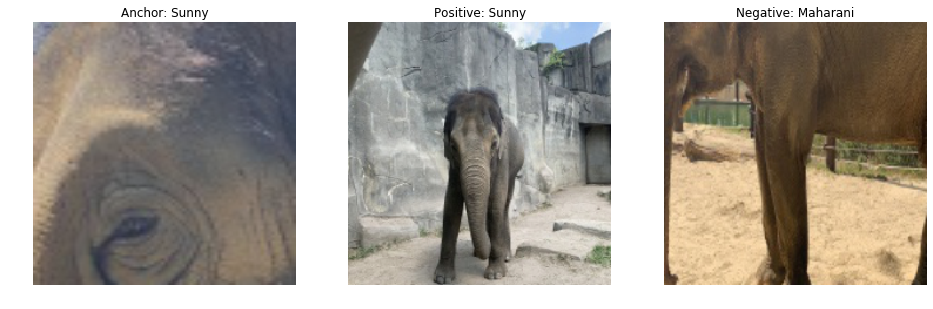

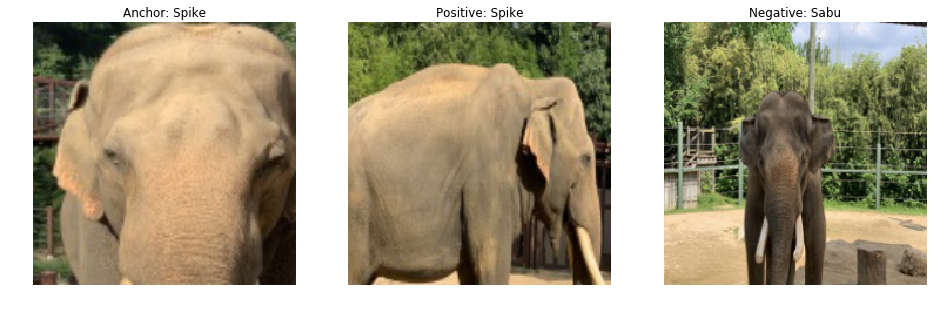

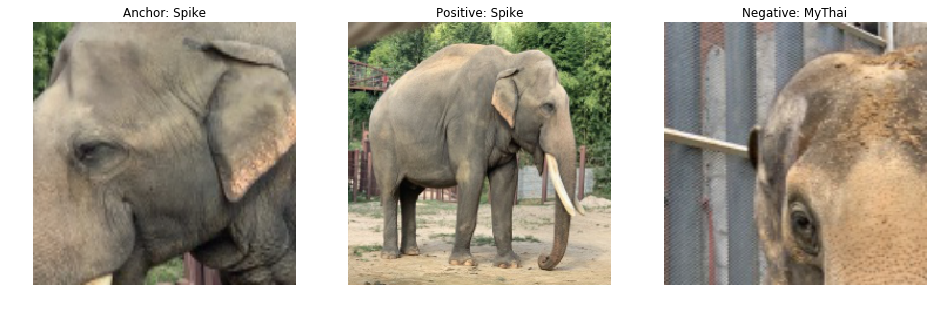

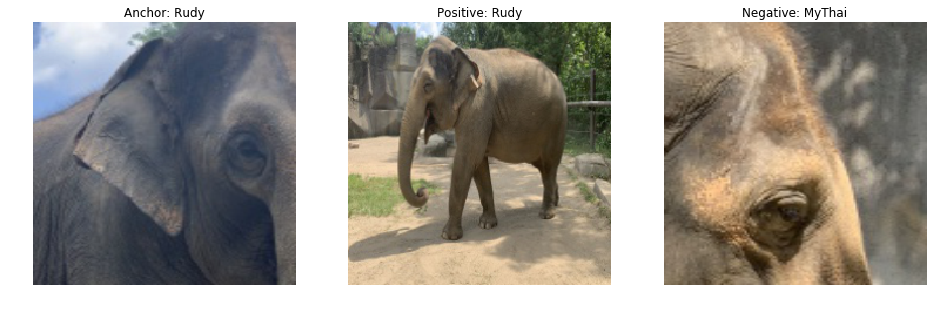

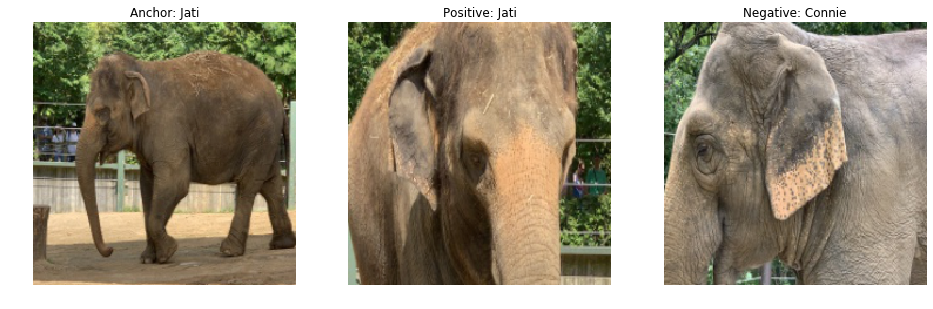

...

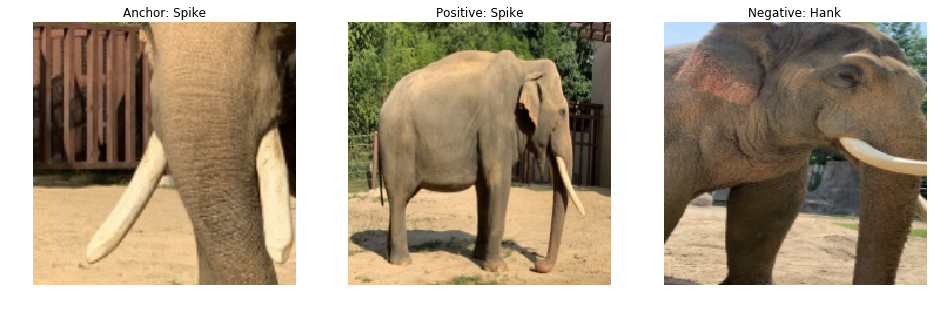

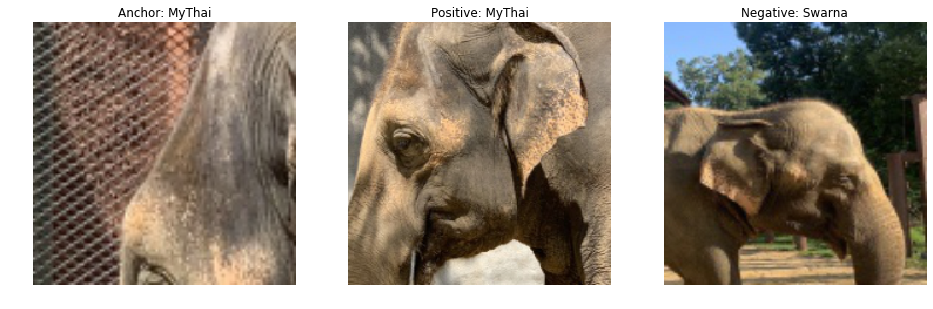

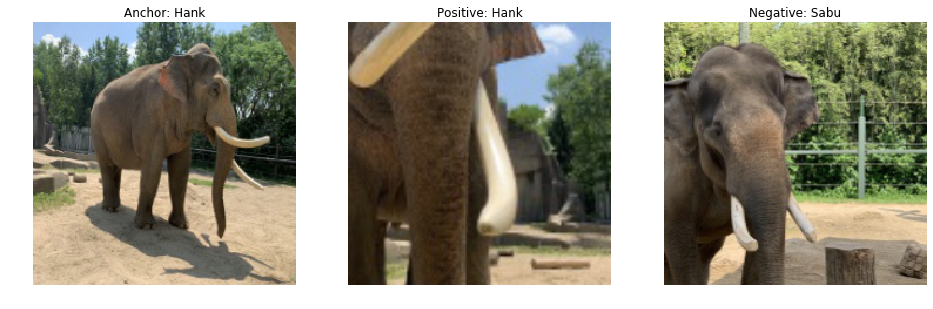

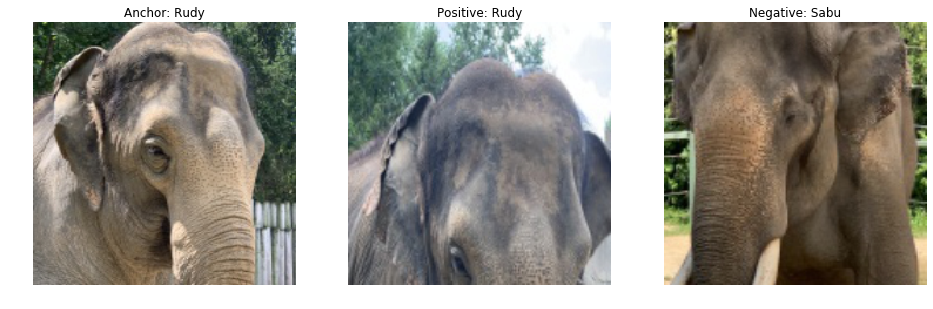

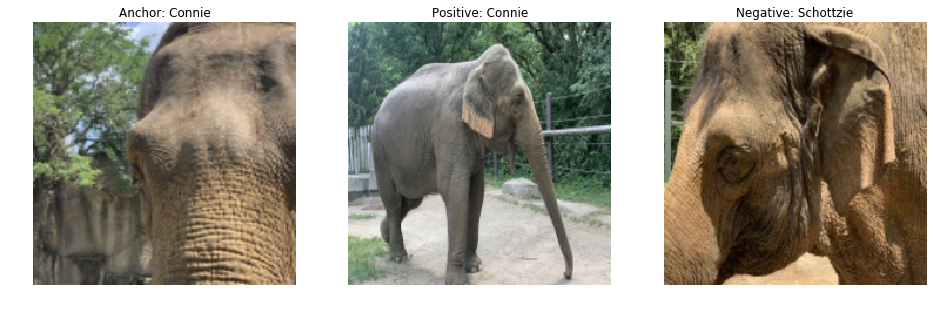

In [8]:
viz_loader =  torch.utils.data.DataLoader(AsianElephantTripletDataset(Config.n_train_triplets, Config.n_test_triplets, True, data_transforms["train"]), batch_size=1, shuffle=True, **kwargs)
dataiter = iter(viz_loader)
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

nrows = 20
ncols = 3
labels = ["Anchor", "Positive", "Negative"]

for row in range(nrows):
    example_batch = next(dataiter)
    fig=plt.figure(figsize=(16,10))
    for i in range(ncols):
        subplot = fig.add_subplot(1,3,i+1)
        plt.axis("off")
        
        image = np.transpose(example_batch[i][0].numpy(),(1,2,0))
        # Undo preprocessing
        image = std * image + mean
        image = np.clip(image, 0, 1)
        plt.imshow(image)
        
        
        subplot.title.set_text(labels[i]  + ": " + example_batch[i+3][0])

### Build Model

In [9]:
import copy
import math
__all__ = ['ResNet', 'resnet18', 'resnet34', 'resnet50', 'resnet101',
           'resnet152']

model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
}


def conv3x3(in_planes, out_planes, stride=1):
    "3x3 convolution with padding"
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(BasicBlock, self).__init__()
        self.conv1 = conv3x3(inplanes, planes, stride)
        
        self.bn1 = nn.BatchNorm2d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.BatchNorm2d(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride,
                               padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class ResNet(nn.Module):

    def __init__(self, block, layers, num_classes=14):
        
        self.inplanes = 64
        
        super(ResNet, self).__init__()
        
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
        self.avgpool = nn.AvgPool2d(7)
        
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_layer(self, block, planes, blocks, stride=1):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        
        return x

In [26]:
class AsianElephantSiemeseNetworkTripletLoss(nn.Module):
    def __init__(self,resnet_conv,convout_dimension):
        super(AsianElephantSiemeseNetworkTripletLoss,self).__init__()
        ## check with Shujon
        self.resnet_conv = resnet_conv
        self.convout_dimension = convout_dimension
        
    def forward(self, x):
        x = self.resnet_conv(x)
        return x.view(-1,self.convout_dimension)



### Triplet Loss

L=max(d(A,P)−d(A,N)+margin,0)

In [27]:
class TripletLoss(torch.nn.Module):
    """
    Triplet Loss
    """
    def __init__(self, margin = 0.2):
        super(TripletLoss,self).__init__()
        self.margin = margin
        if self.margin is None:  # use soft-margin
            self.Loss = nn.SoftMarginLoss()
        else:
            ## Euclidean norm
            self.Loss = nn.TripletMarginLoss(margin = margin, p = 2)
            
    def forward(self, encoded_anchor, encoded_pos, encoded_neg):
        ap_dist = torch.norm(encoded_anchor - encoded_pos, 2, dim = 1)
        an_dist = torch.norm(encoded_anchor - encoded_neg, 2, dim = 1)
        
        if self.margin is None:
            loss = self.Loss(an_dist - ap_dist, y)
        else:
            loss = self.Loss(encoded_anchor, encoded_pos, encoded_neg)
        
        return loss

## Evaluation Metrics

In [28]:
from sklearn.metrics import roc_curve,roc_auc_score

def compute_dist(a,b):
    a = a.numpy()
    b = b.numpy()
    
    return np.sum(np.square(a-b))

def compute_probs(network,X,Y):
    '''
    Input
        network : current NN to compute embeddings
        X : tensor of shape (m,w,h,1) containing pics to evaluate
        Y : tensor of shape (m,) containing true class
        
    Returns
        probs : array of shape (m,m) containing distances
    
    '''
    m = X.shape[0]
    nbevaluation = int(m*(m-1)/2)
    probs = np.zeros((nbevaluation))
    y = np.zeros((nbevaluation))
    
    #Compute all embeddings for all pics with current network
    embeddings = network(X.cuda())
    embeddings = embeddings.detach().cpu()
    
    size_embedding = embeddings.shape[1]
    
    #For each pics of our dataset
    k = 0
    for i in range(m):
        #Against all other images
        for j in range(i+1,m):
            #compute the probability of being the right decision : it should be 1 for right class, 0 for all other classes
            probs[k] = -compute_dist(embeddings[i,:],embeddings[j,:])
            if (Y[i]==Y[j]):
                y[k] = 1
            else:
                y[k] = 0
                #print("{3}:{0} vs {1} : \t\t\t{2}\tDIFF".format(i,j,probs[k],k))
            k += 1
    return probs,y

def compute_metrics(probs,yprobs):
    '''
    Returns
        fpr : Increasing false positive rates such that element i is the false positive rate of predictions with score >= thresholds[i]
        tpr : Increasing true positive rates such that element i is the true positive rate of predictions with score >= thresholds[i].
        thresholds : Decreasing thresholds on the decision function used to compute fpr and tpr. thresholds[0] represents no instances being predicted and is arbitrarily set to max(y_score) + 1
        auc : Area Under the ROC Curve metric
    '''
    # calculate AUC
    auc = roc_auc_score(yprobs, probs)
    # calculate roc curve
    fpr, tpr, thresholds = roc_curve(yprobs, probs)
    
    return fpr, tpr, thresholds,auc


def find_nearest(array,value):
    idx = np.searchsorted(array, value, side="left")
    if idx > 0 and (idx == len(array) or math.fabs(value - array[idx-1]) < math.fabs(value - array[idx])):
        return array[idx-1],idx-1
    else:
        return array[idx],idx

def draw_roc(fpr, tpr,thresholds,auc):
    #find threshold
    targetfpr=1e-3
    _, idx = find_nearest(fpr,targetfpr)
    threshold = thresholds[idx]
    recall = tpr[idx]
    
    
    # plot no skill
    plt.plot([0, 1], [0, 1], linestyle='--')
    # plot the roc curve for the model
    plt.plot(fpr, tpr, marker='.')
    plt.title('AUC: {0:.3f}\nSensitivity : {2:.1%} @FPR={1:.0e}\nThreshold={3})'.format(auc,targetfpr,recall,abs(threshold) ))
    # show the plot
    plt.show()


## Train Model

In [29]:
model = ResNet(BasicBlock, [3, 4, 6, 3])

model = AsianElephantSiemeseNetworkTripletLoss(model, 512)
if torch.cuda.is_available:
    if torch.cuda.device_count()>1:
        print("Let's use", torch.cuda.device_count(), "GPUs!")
        model = nn.DataParallel(model)
    model = model.cuda()
    
criterion = TripletLoss()
if torch.cuda.device_count()>1:
    optimizer = optim.Adam(model.module.parameters(),lr = Config.learning_rate)
else:
    optimizer = optim.Adam(model.parameters(),lr = Config.learning_rate)

In [30]:
model

AsianElephantSiemeseNetworkTripletLoss(
  (resnet_conv): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.

In [14]:
def train(epoch):
    model.train()
    losses = RunningAverage("Train loss")
    print("Training the model:{}".format(epoch))
    for batch_idx, (data_a, data_p, data_n, label_a, label_p, label_n) in enumerate(train_loader):
        data_a, data_p, data_n = data_a.cuda(), data_p.cuda(), data_n.cuda()
        
        ## optimizer zero grad
        ## Optimizer - reset gradients
        optimizer.zero_grad()
        
        
        ## forward pass, extract features
        embeddings_anchor = model(data_a)
        embeddings_pos = model(data_p)
        embeddings_neg = model(data_n)
        
        ## compute contrastive loss
        loss_triplet = criterion(embeddings_anchor,embeddings_pos,embeddings_neg)
        
        if batch_idx % Config.log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data_a), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss_triplet.item()))
            
        losses.update(loss_triplet.item(), data_a.size(0))
        
        loss_triplet.backward()
        
        ## update the weights
        optimizer.step()
        
        
    return losses.avg


In [15]:
val_origin, val_y_origin = next(iter(val_loader))

In [16]:
test_dataset = dset.ImageFolder(Config.test_dir, data_transforms["test"])
test_loader = torch.utils.data.DataLoader(test_dataset,batch_size=len(test_dataset),shuffle=False)
test_origin, test_y_origin = next(iter(test_loader))

In [17]:
def test(epoch):
    model.eval()
    with torch.no_grad():
        probs,yprob = compute_probs(model, test_origin[:,:,:,:],test_y_origin[:])
        fpr, tpr, threshold,auc = compute_metrics(probs,yprob)
        draw_roc(fpr,tpr, threshold,auc)
        
    return auc, threshold

Starting training process!
----------------------------------------------------------------------------------------------------
Training the model:0
Train Epoch: 0 [0/2000 (0%)]	Loss: 1.253874

 ------------- 

[50] Time for 0 iterations: 0.8 mins, Train Loss: 0.35570286417007446


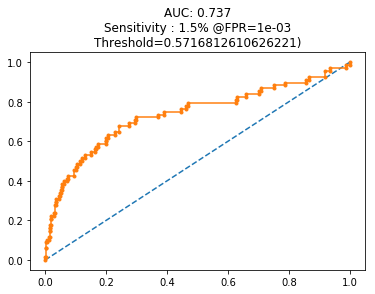

Training the model:1
Train Epoch: 1 [0/2000 (0%)]	Loss: 0.075423
Training the model:2
Train Epoch: 2 [0/2000 (0%)]	Loss: 0.125957
Training the model:3
Train Epoch: 3 [0/2000 (0%)]	Loss: 0.118121
Training the model:4
Train Epoch: 4 [0/2000 (0%)]	Loss: 0.203062
Training the model:5
Train Epoch: 5 [0/2000 (0%)]	Loss: 0.157791
Training the model:6
Train Epoch: 6 [0/2000 (0%)]	Loss: 0.078005
Training the model:7
Train Epoch: 7 [0/2000 (0%)]	Loss: 0.109085
Training the model:8
Train Epoch: 8 [0/2000 (0%)]	Loss: 0.172477
Training the model:9
Train Epoch: 9 [0/2000 (0%)]	Loss: 0.157610
Training the model:10
Train Epoch: 10 [0/2000 (0%)]	Loss: 0.117109

 ------------- 

[50] Time for 10 iterations: 9.2 mins, Train Loss: 0.12278093387186527


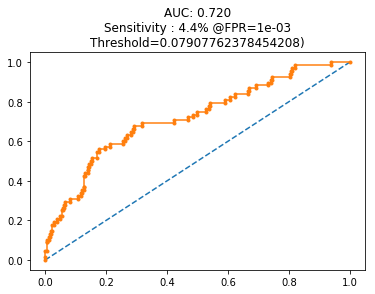

Training the model:11
Train Epoch: 11 [0/2000 (0%)]	Loss: 0.139139
Training the model:12
Train Epoch: 12 [0/2000 (0%)]	Loss: 0.161832
Training the model:13
Train Epoch: 13 [0/2000 (0%)]	Loss: 0.111396
Training the model:14
Train Epoch: 14 [0/2000 (0%)]	Loss: 0.080074
Training the model:15
Train Epoch: 15 [0/2000 (0%)]	Loss: 0.095633
Training the model:16
Train Epoch: 16 [0/2000 (0%)]	Loss: 0.103580
Training the model:17
Train Epoch: 17 [0/2000 (0%)]	Loss: 0.104773
Training the model:18
Train Epoch: 18 [0/2000 (0%)]	Loss: 0.087998
Training the model:19
Train Epoch: 19 [0/2000 (0%)]	Loss: 0.110714
Training the model:20
Train Epoch: 20 [0/2000 (0%)]	Loss: 0.140702

 ------------- 

[50] Time for 20 iterations: 17.6 mins, Train Loss: 0.10470898231863976


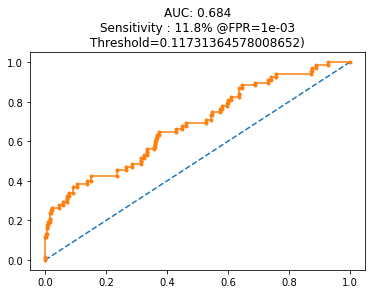

Training the model:21
Train Epoch: 21 [0/2000 (0%)]	Loss: 0.083590
Training the model:22
Train Epoch: 22 [0/2000 (0%)]	Loss: 0.057646
Training the model:23
Train Epoch: 23 [0/2000 (0%)]	Loss: 0.083566
Training the model:24
Train Epoch: 24 [0/2000 (0%)]	Loss: 0.049582
Training the model:25
Train Epoch: 25 [0/2000 (0%)]	Loss: 0.131982
Training the model:26
Train Epoch: 26 [0/2000 (0%)]	Loss: 0.097503
Training the model:27
Train Epoch: 27 [0/2000 (0%)]	Loss: 0.072786
Training the model:28
Train Epoch: 28 [0/2000 (0%)]	Loss: 0.075653
Training the model:29
Train Epoch: 29 [0/2000 (0%)]	Loss: 0.091358
Training the model:30
Train Epoch: 30 [0/2000 (0%)]	Loss: 0.162210

 ------------- 

[50] Time for 30 iterations: 26.0 mins, Train Loss: 0.09578929923474788


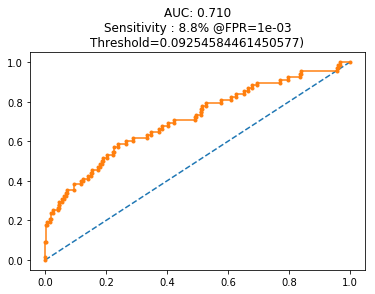

Training the model:31
Train Epoch: 31 [0/2000 (0%)]	Loss: 0.089295
Training the model:32
Train Epoch: 32 [0/2000 (0%)]	Loss: 0.091946
Training the model:33
Train Epoch: 33 [0/2000 (0%)]	Loss: 0.124791
Training the model:34
Train Epoch: 34 [0/2000 (0%)]	Loss: 0.032773
Training the model:35
Train Epoch: 35 [0/2000 (0%)]	Loss: 0.129728
Training the model:36
Train Epoch: 36 [0/2000 (0%)]	Loss: 0.147414
Training the model:37
Train Epoch: 37 [0/2000 (0%)]	Loss: 0.142906
Training the model:38
Train Epoch: 38 [0/2000 (0%)]	Loss: 0.065452
Training the model:39
Train Epoch: 39 [0/2000 (0%)]	Loss: 0.035433
Training the model:40
Train Epoch: 40 [0/2000 (0%)]	Loss: 0.059693

 ------------- 

[50] Time for 40 iterations: 34.4 mins, Train Loss: 0.07649051462113857


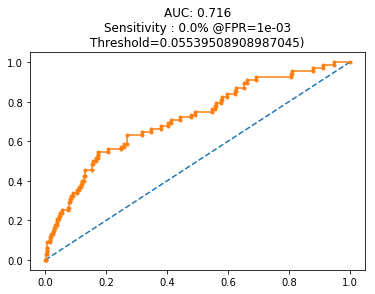

Training the model:41
Train Epoch: 41 [0/2000 (0%)]	Loss: 0.045983
Training the model:42
Train Epoch: 42 [0/2000 (0%)]	Loss: 0.134139
Training the model:43
Train Epoch: 43 [0/2000 (0%)]	Loss: 0.130814
Training the model:44
Train Epoch: 44 [0/2000 (0%)]	Loss: 0.093963
Training the model:45
Train Epoch: 45 [0/2000 (0%)]	Loss: 0.095303
Training the model:46
Train Epoch: 46 [0/2000 (0%)]	Loss: 0.116868
Training the model:47
Train Epoch: 47 [0/2000 (0%)]	Loss: 0.120348
Training the model:48
Train Epoch: 48 [0/2000 (0%)]	Loss: 0.030587
Training the model:49
Train Epoch: 49 [0/2000 (0%)]	Loss: 0.118764
Training the model:50
Train Epoch: 50 [0/2000 (0%)]	Loss: 0.036497

 ------------- 

[50] Time for 50 iterations: 42.7 mins, Train Loss: 0.0650868470966816


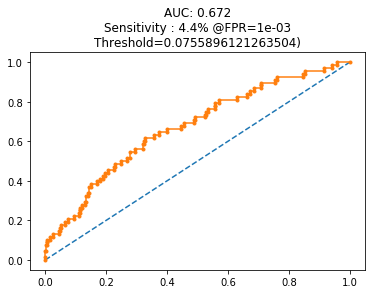

Training the model:51
Train Epoch: 51 [0/2000 (0%)]	Loss: 0.115987
Training the model:52
Train Epoch: 52 [0/2000 (0%)]	Loss: 0.018639
Training the model:53
Train Epoch: 53 [0/2000 (0%)]	Loss: 0.087993
Training the model:54
Train Epoch: 54 [0/2000 (0%)]	Loss: 0.094619
Training the model:55
Train Epoch: 55 [0/2000 (0%)]	Loss: 0.064870
Training the model:56
Train Epoch: 56 [0/2000 (0%)]	Loss: 0.005146
Training the model:57
Train Epoch: 57 [0/2000 (0%)]	Loss: 0.018948
Training the model:58
Train Epoch: 58 [0/2000 (0%)]	Loss: 0.143598
Training the model:59
Train Epoch: 59 [0/2000 (0%)]	Loss: 0.152936
Training the model:60
Train Epoch: 60 [0/2000 (0%)]	Loss: 0.025824

 ------------- 

[50] Time for 60 iterations: 51.1 mins, Train Loss: 0.04263086624443531


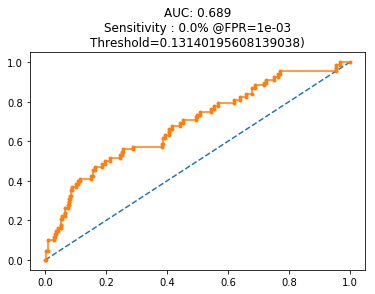

Training the model:61
Train Epoch: 61 [0/2000 (0%)]	Loss: 0.059579
Training the model:62
Train Epoch: 62 [0/2000 (0%)]	Loss: 0.009484
Training the model:63
Train Epoch: 63 [0/2000 (0%)]	Loss: 0.000000
Training the model:64
Train Epoch: 64 [0/2000 (0%)]	Loss: 0.055527
Training the model:65
Train Epoch: 65 [0/2000 (0%)]	Loss: 0.029492
Training the model:66
Train Epoch: 66 [0/2000 (0%)]	Loss: 0.047152
Training the model:67
Train Epoch: 67 [0/2000 (0%)]	Loss: 0.007375
Training the model:68
Train Epoch: 68 [0/2000 (0%)]	Loss: 0.087089
Training the model:69
Train Epoch: 69 [0/2000 (0%)]	Loss: 0.086029
Training the model:70
Train Epoch: 70 [0/2000 (0%)]	Loss: 0.017968

 ------------- 

[50] Time for 70 iterations: 59.4 mins, Train Loss: 0.045290040999650956


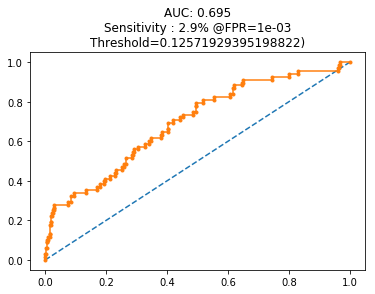

Training the model:71
Train Epoch: 71 [0/2000 (0%)]	Loss: 0.102890
Training the model:72
Train Epoch: 72 [0/2000 (0%)]	Loss: 0.049109
Training the model:73
Train Epoch: 73 [0/2000 (0%)]	Loss: 0.033340
Training the model:74
Train Epoch: 74 [0/2000 (0%)]	Loss: 0.055353
Training the model:75
Train Epoch: 75 [0/2000 (0%)]	Loss: 0.100828
Training the model:76
Train Epoch: 76 [0/2000 (0%)]	Loss: 0.011064
Training the model:77
Train Epoch: 77 [0/2000 (0%)]	Loss: 0.000000
Training the model:78
Train Epoch: 78 [0/2000 (0%)]	Loss: 0.000000
Training the model:79
Train Epoch: 79 [0/2000 (0%)]	Loss: 0.054913
Training the model:80
Train Epoch: 80 [0/2000 (0%)]	Loss: 0.050014

 ------------- 

[50] Time for 80 iterations: 67.7 mins, Train Loss: 0.03207188656926155


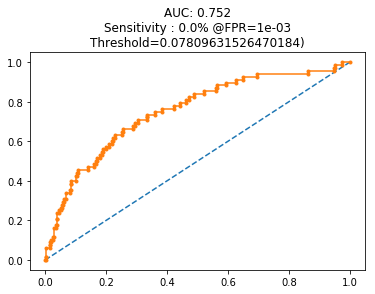

Training the model:81
Train Epoch: 81 [0/2000 (0%)]	Loss: 0.000000
Training the model:82
Train Epoch: 82 [0/2000 (0%)]	Loss: 0.005549
Training the model:83
Train Epoch: 83 [0/2000 (0%)]	Loss: 0.003200
Training the model:84
Train Epoch: 84 [0/2000 (0%)]	Loss: 0.056573
Training the model:85
Train Epoch: 85 [0/2000 (0%)]	Loss: 0.000000
Training the model:86
Train Epoch: 86 [0/2000 (0%)]	Loss: 0.034270
Training the model:87
Train Epoch: 87 [0/2000 (0%)]	Loss: 0.000000
Training the model:88
Train Epoch: 88 [0/2000 (0%)]	Loss: 0.109073
Training the model:89
Train Epoch: 89 [0/2000 (0%)]	Loss: 0.093357
Training the model:90
Train Epoch: 90 [0/2000 (0%)]	Loss: 0.029040

 ------------- 

[50] Time for 90 iterations: 76.0 mins, Train Loss: 0.03616473773121834


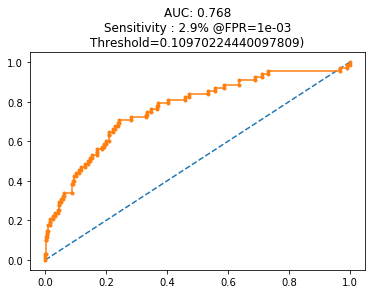

Training the model:91
Train Epoch: 91 [0/2000 (0%)]	Loss: 0.025612
Training the model:92
Train Epoch: 92 [0/2000 (0%)]	Loss: 0.068184
Training the model:93
Train Epoch: 93 [0/2000 (0%)]	Loss: 0.000000
Training the model:94
Train Epoch: 94 [0/2000 (0%)]	Loss: 0.000000
Training the model:95
Train Epoch: 95 [0/2000 (0%)]	Loss: 0.024978
Training the model:96
Train Epoch: 96 [0/2000 (0%)]	Loss: 0.030937
Training the model:97
Train Epoch: 97 [0/2000 (0%)]	Loss: 0.059888
Training the model:98
Train Epoch: 98 [0/2000 (0%)]	Loss: 0.095973
Training the model:99
Train Epoch: 99 [0/2000 (0%)]	Loss: 0.016962
Best Epoch: 90, Best AUC: 0.7676387970918706, Best Threshold: [ 0.91837569 -0.08162431 -0.10683624 -0.10970224 -0.130009   -0.13106011
 -0.131576   -0.14119312 -0.14129293 -0.14357789 -0.14376521 -0.14730479
 -0.16643451 -0.17003343 -0.17293966 -0.17989296 -0.18096478 -0.18459471
 -0.18563607 -0.19354936 -0.19519368 -0.20628005 -0.20850162 -0.21176594
 -0.21470109 -0.21655652 -0.21744743 -0.224

In [76]:
import time

print("Starting training process!")
print("-"*100)

t_start = time.time()
best_auc = -999
best_threshold = 0
t_start = time.time()
auc_epochs = []
threshold_list = []
losses = []
best_epoch = 0
for epoch in range(100):
    train_loss = train(epoch)
    losses.append(train_loss)
    if epoch % Config.test_freq == 0:
        print("\n ------------- \n")
        print("[{3}] Time for {0} iterations: {1:.1f} mins, Train Loss: {2}".format(epoch, (time.time()-t_start)/60.0,train_loss,Config.nepochs))
        auc, threshold = test(epoch)
        auc_epochs.append(auc)
        if auc>best_auc:
            best_auc = auc
            best_threshold = threshold        
            best_epoch = epoch
            ## Save model
            torch.save(model.state_dict(), './best_siamese_triplet_loss.pth')
            
print("Best Epoch: {}, Best AUC: {}, Best Threshold: {}".format(best_epoch,best_auc,best_threshold))

In [74]:
Config.nepochs

50

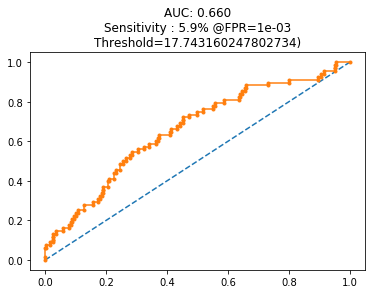

In [146]:
auc, threshold = test(epoch)
auc_epochs.append(auc)
if auc>best_auc:
    best_auc = auc
    best_threshold = threshold        
    ## Save model
    torch.save(model.state_dict(), './best_siamese_triplet_loss.pth')

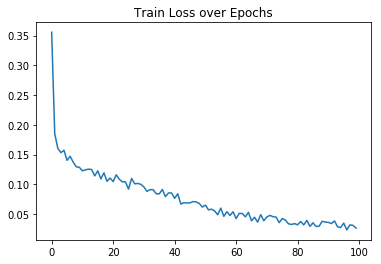

In [77]:
plt.title("Train Loss over Epochs")
plt.plot(losses)

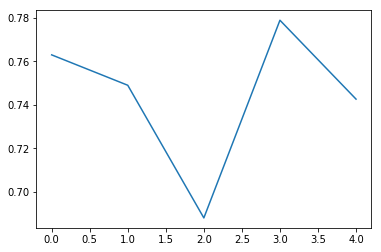

In [47]:
plt.plot(auc_epochs)

## Test

In [31]:
checkpoint = torch.load("best_siamese_triplet_loss.pth",map_location="cuda:0")
model = nn.DataParallel(model)
model = model.cuda()
model.load_state_dict(checkpoint)
print("=> loaded checkpoint ")



=> loaded checkpoint 


In [33]:
model = model.eval()

## Testing Query and Gallery Images


**Query Images - New Test Photos**
<p>Query images are handpicked from the "New Test Photos" folder:</p>

Actual Names:

1. Hank - IMG_4482.JPG
2. Jati - DSC_0580.JPG
3. Sunny - IMG_4494.JPG


Query Images


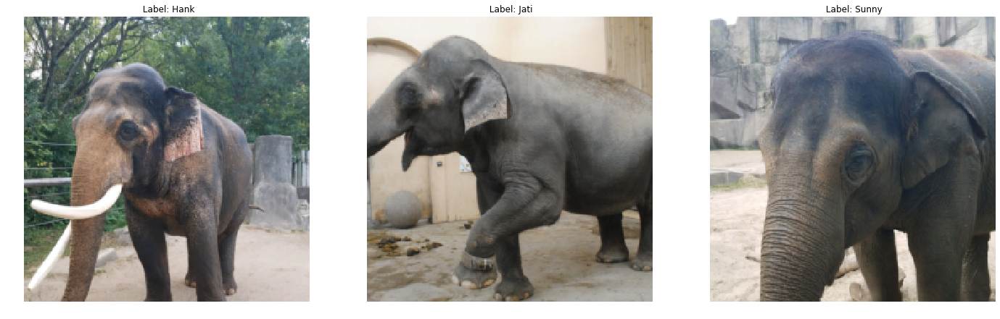

In [34]:
query_image_folder = dset.ImageFolder(root = Config.query_dir, transform=data_transforms["test"])

query_image_dataloader =torch.utils.data.DataLoader(query_image_folder,batch_size = 3, shuffle=False)
query_images, query_y = next(iter(query_image_dataloader))
query_labels = ["Hank","Jati","Sunny"]

fig = plt.figure(figsize= (24,20))
print("Query Images")
for i in range(3):
    plt.subplot(1, 3, (i+1))
    
    
    image = np.transpose(query_images[i].numpy(),(1,2,0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = np.clip(image, 0, 1)
    plt.axis("off")
    plt.imshow(image)
    plt.title(f" Label: {query_labels[i]}")
plt.show()

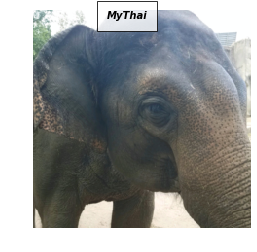

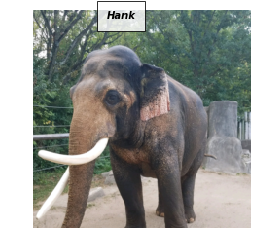

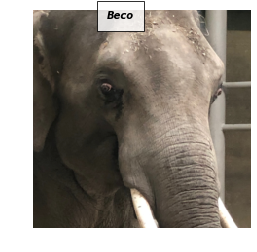

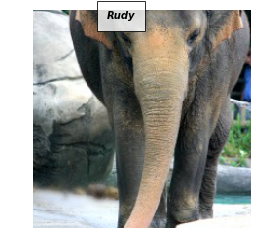

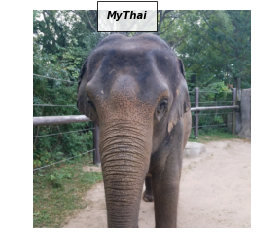

In [79]:
#dataset_train = torch.stack(dataset_train) 
test_loader = torch.utils.data.DataLoader(test_dataset,batch_size=len(test_dataset),shuffle=True)
test_origin, test_y_origin = next(iter(test_loader))
dataset_test, dataset_labels = test_origin[:5], test_y_origin[:5]
for i in range(5):
    imshow(dataset_test[i], classes[dataset_labels[i]])
    

### Template Images - Gallery Images  (Super Clean Images)

Gallery Images are handpicked from the super clean images

Actual Names:

1. Beco - IMG_7267.JPG
2. Connie - IMG_2381.JPG
3. Hank - IMG_7099.JPG
4. Jati - IMG_3104.JPG
5. Kamala - IMG_2396.JPG
6. Maharani - IMG_3589.JPG
7. MyThai - IMG_3505.JPG
8. Pheobe - IMG_5423.JPG
9. Rudy - IMG_0297.JPG
10. Sabu - IMG_4228.JPG
11. Schottzie - IMG_5316.JPG
12. Spike - IMG_0807.JPG
13. Sunny - IMG_9144.JPG
14. Swarna - IMG_9901.JPG


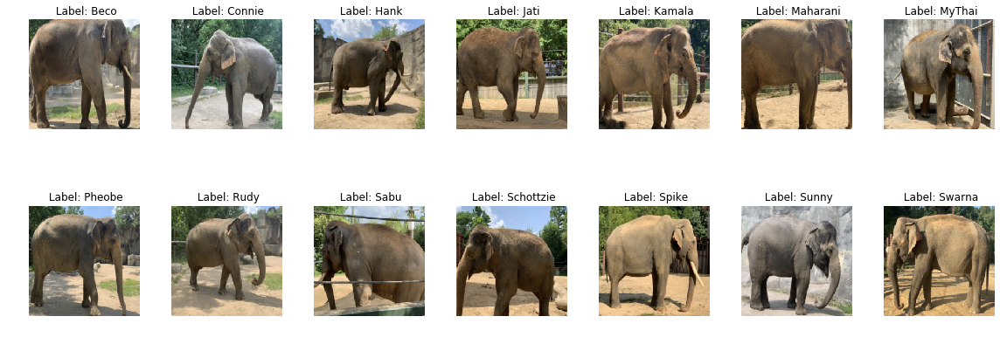

In [36]:
## Gallery Images
gallery_image_folder = dset.ImageFolder(root=Config.gallery_dir, transform = data_transforms["test"])
gallery_loader = torch.utils.data.DataLoader(gallery_image_folder, batch_size = len(gallery_image_folder), sampler=None, 
                                        num_workers = 4,shuffle=True)
gallery_origin, gallery_y_origin = next(iter(gallery_loader))



dataset_gallery = []
classes = gallery_image_folder.classes

fig = plt.figure(figsize=(16,12))
for n in range(Config.num_classes):
    
    ax1 = plt.subplot(4, 7, (n+1))
    images_class_n = ([row for idx,row in enumerate(gallery_origin) if gallery_y_origin[idx]==n])[0]
    dataset_gallery.append(images_class_n)
    npimg = images_class_n.numpy()
        
    image = np.transpose(npimg,(1,2,0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = np.clip(image, 0, 1)
    
    ax1.set_aspect('equal')
    plt.axis("off")
    plt.imshow(image)
    plt.title(f" Label: {classes[n]}")
    

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.show()

## Display Distance For Each Elephant

In [41]:
## Distance of three test inputs
%matplotlib inline
def display_elephant(img):
    npimg = img.numpy()
    image = np.transpose(npimg,(1,2,0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = np.clip(image, 0, 1)
    plt.axis("Off")
    
    plt.imshow(image)
    
def test_image(model, gallery_images,gallery_image_classes, query_image, query_image_label):
    
    """
    Test some images - with respect to the distance between test image class and rest of the classes
    """
    nbimages = len(gallery_images)
    gallery_image_embeddings = []
    for i in range(len(gallery_images)):
        plt.subplot(2,8,(i+1))
        display_elephant(gallery_images[i])
        plt.title(gallery_image_classes[i])
        gallery_image_embeddings.append(model.forward(gallery_images[i].unsqueeze(0).cuda()).detach().cpu().numpy())
    plt.show()
    nb_classes = Config.num_classes
    gallery_image_embeddings = np.array(gallery_image_embeddings)
    
    ## testloader
    ref_embedings = model.forward(query_image.unsqueeze(0).cuda())
    ref_embedings = ref_embedings.detach().cpu()
    ref_embedings = ref_embedings[0]
    
    ref_embedings  = ref_embedings.numpy()
    ## figure
    plotidx = 0
    plt.title("Test image:  " + query_image_label)
    display_elephant(query_image)
    plt.show()
    distances = []
    figure = plt.figure(figsize=(30,20))
    for ref in range(nb_classes):
         
        #Compute distance between this images and references
        
        dist = np.sum(np.square(gallery_image_embeddings[ref][0]-ref_embedings))
        distances.append(dist)
        
        #Draw
        ax1 = plt.subplot(4, 4, (plotidx+1))
        display_elephant(gallery_images[ref])
        plt.title(("Class {0}\n{1:.3e}".format(gallery_image_classes[ref],dist)))
        plotidx += 1
    
    
    
    sort_index = np.argsort(distances)
    print([gallery_image_classes[i]+ f"({str(distances[i])})" for i in sort_index])
    plt.tight_layout()
    plt.show()

### Evaluate The Distance of Query Images - Template Images

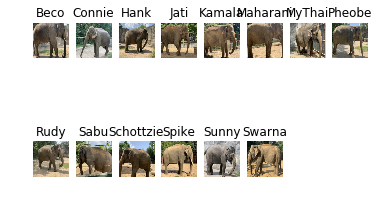

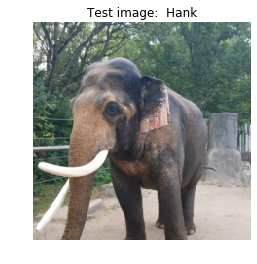

['Connie(0.19227941)', 'Rudy(0.32636362)', 'Pheobe(0.74323136)', 'Hank(0.89273596)', 'Sunny(0.90635216)', 'MyThai(0.9118323)', 'Beco(1.040185)', 'Schottzie(1.0801783)', 'Maharani(1.7196301)', 'Kamala(2.026074)', 'Jati(2.0986853)', 'Sabu(2.5719762)', 'Spike(2.5955951)', 'Swarna(3.0860376)']


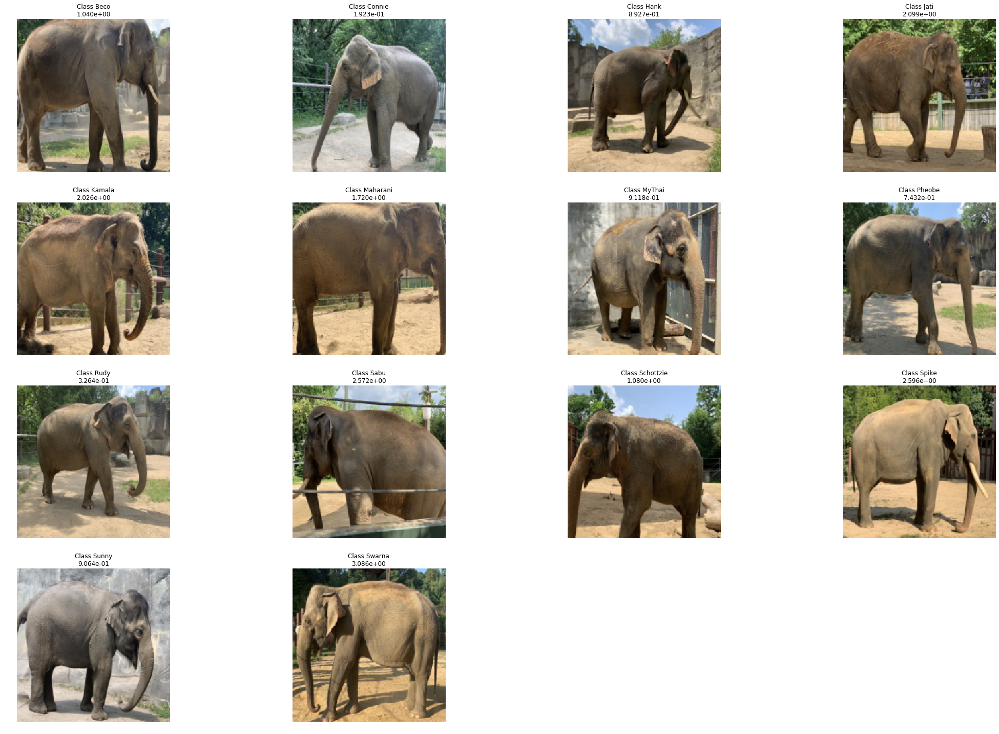

In [42]:
test_image(model, dataset_gallery,gallery_image_folder.classes, query_images[0], query_labels[0])

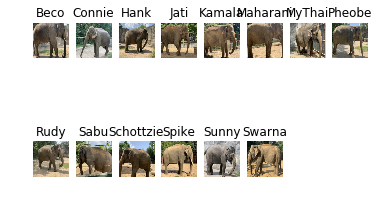

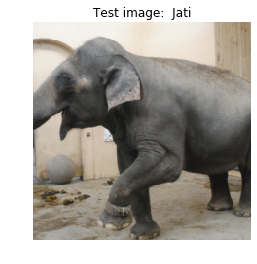

['Rudy(0.68361914)', 'Sunny(0.7758367)', 'Connie(0.8056555)', 'MyThai(1.0037675)', 'Beco(1.4688516)', 'Pheobe(1.8347709)', 'Hank(2.5002604)', 'Swarna(2.621687)', 'Schottzie(2.955347)', 'Spike(2.9597168)', 'Maharani(3.1659274)', 'Jati(3.269784)', 'Sabu(3.9591606)', 'Kamala(4.062398)']


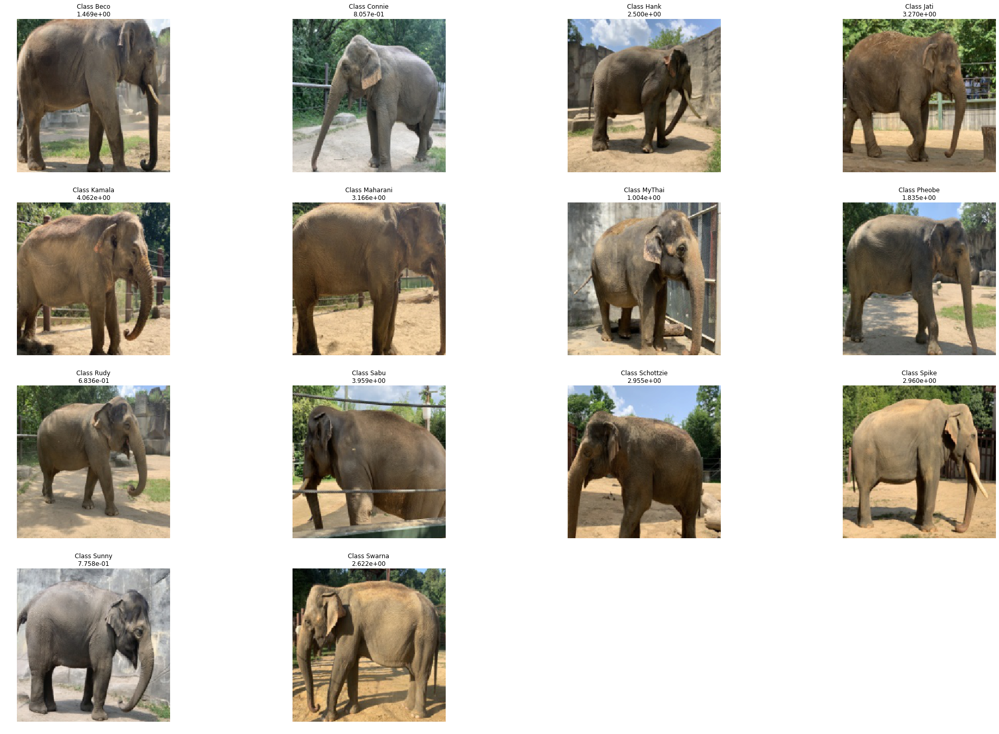

In [43]:
test_image(model, dataset_gallery,gallery_image_folder.classes, query_images[1], query_labels[1])

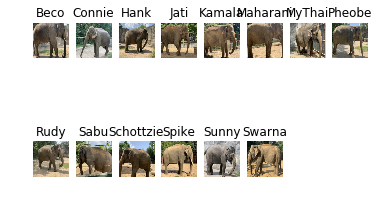

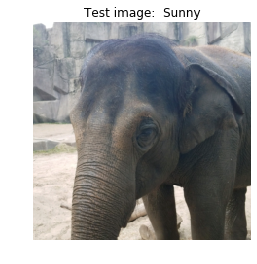

['Rudy(0.5156846)', 'Connie(0.5870054)', 'Sunny(0.6994384)', 'Pheobe(0.7582771)', 'Beco(0.8576962)', 'Hank(0.97259486)', 'MyThai(1.2037883)', 'Maharani(1.3563948)', 'Schottzie(1.552851)', 'Kamala(1.8374164)', 'Jati(2.9529786)', 'Spike(3.196869)', 'Sabu(3.5262237)', 'Swarna(3.881621)']


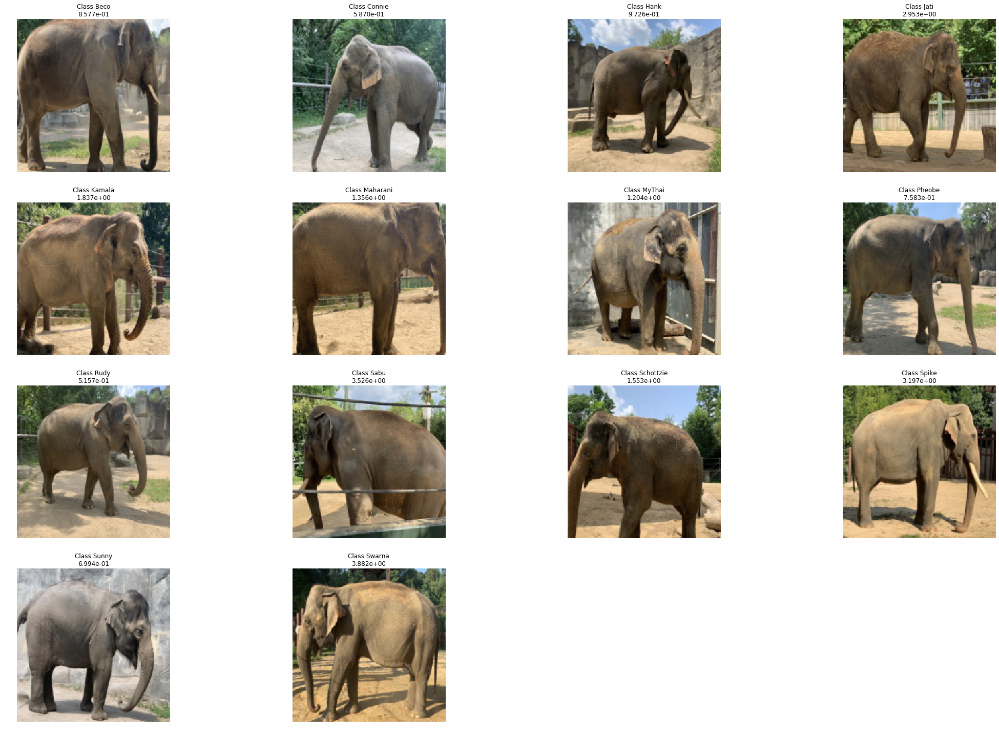

In [44]:
test_image(model, dataset_gallery,gallery_image_folder.classes, query_images[2], query_labels[2])

In [363]:
dataset_labels[0]

tensor(7)

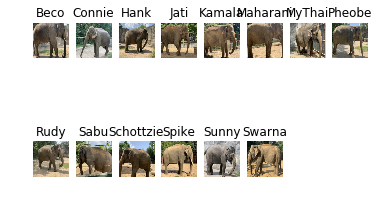

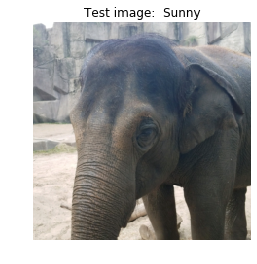

['Rudy(0.5156846)', 'Connie(0.5870054)', 'Sunny(0.6994384)', 'Pheobe(0.7582771)', 'Beco(0.8576962)', 'Hank(0.97259486)', 'MyThai(1.2037883)', 'Maharani(1.3563948)', 'Schottzie(1.552851)', 'Kamala(1.8374164)', 'Jati(2.9529786)', 'Spike(3.196869)', 'Sabu(3.5262237)', 'Swarna(3.881621)']


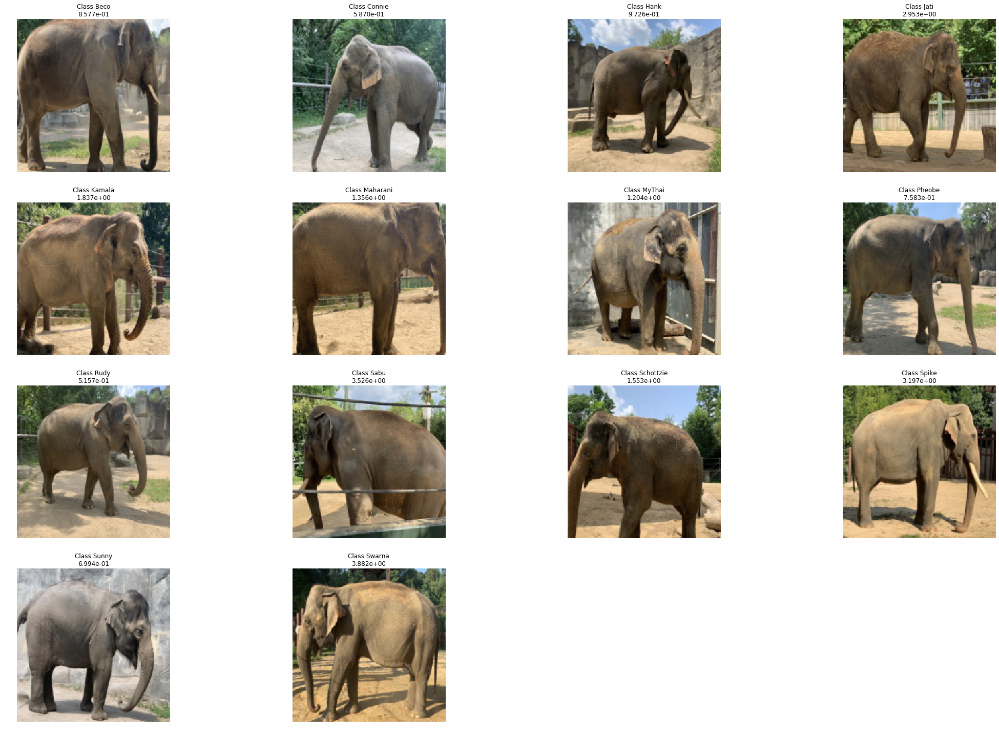

In [45]:
test_image(model, dataset_gallery,gallery_image_folder.classes, query_images[2], query_labels[2])